## 한글 폰트 설치

In [ ]:
# !sudo apt-get install -y fonts-nanum
# !sudo fc-cache -fv
# !rm ~/.cache/matplotlib -rf

## 필요한 모듈 불러오기

In [ ]:
# 기본적인 라이브러리
import numpy as np
import pandas as pd
import warnings
warnings.filterwarnings('ignore')
from google.colab import data_table
data_table.enable_dataframe_formatter()
import unicodedata

# 시각화를 위한 라이브러리
import missingno as msno
import matplotlib.pyplot as plt
import matplotlib.ticker as mticker
plt.style.use('fivethirtyeight')
plt.rc('font', family='NanumBarunGothic')


import seaborn as sns
sns.set(font="NanumBarunGothic", 
        rc={"axes.unicode_minus":False},
        style='darkgrid',
        font_scale=1.0)
sns.color_palette("Set2")


# 시계열 분석을 위한 라이브러리
import math
import statsmodels.api as sm
from numpy.random import normal, seed
from scipy.stats import norm
from statsmodels.tsa.arima_model import ARMA
from statsmodels.tsa.stattools import adfuller
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.arima_process import ArmaProcess
from statsmodels.tsa.arima_model import ARIMA
from sklearn.metrics import mean_squared_error

## 데이터 불러오기

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
df = pd.read_csv('/content/drive/MyDrive/[해커톤] 낮잠, 수요지리분석/DATA/drive-download-20211027T031523Z-001/20211022_sample_hackathon_data.csv'\
                 , encoding='cp949')
df.head()

,region1,region2,reservation_return_at,reservation_start_at,age_group,gender,car_model
0,울산광역시,남구,2019-09-29 21:25:40+00:00,2019-09-29 19:20:00+00:00,1,male,경형
1,울산광역시,남구,2019-07-13 13:11:21+00:00,2019-07-13 11:00:00+00:00,1,male,준중형
2,울산광역시,남구,2019-09-16 23:43:08+00:00,2019-09-16 19:10:00+00:00,1,male,준중형
3,울산광역시,남구,2019-08-09 06:17:41+00:00,2019-08-09 00:20:00+00:00,1,male,준중형
4,울산광역시,남구,2019-07-24 12:36:29+00:00,2019-07-24 09:00:00+00:00,2,male,경형


In [ ]:
df.reservation_return_at = pd.to_datetime(df.reservation_return_at)
df.reservation_start_at = pd.to_datetime(df.reservation_start_at)

In [ ]:
# 반납시간 - 빌린시간
df['use_time'] = df.reservation_return_at - df.reservation_start_at

use_total_hour = []
for i, time in enumerate(df.use_time):
    seconds = time.seconds
    hours = seconds // 3600
    use_total_hour.append(round(time.days * 24 + seconds/3600, 2))
  
df['use_total_hr'] = use_total_hour

In [ ]:
holiday = pd.read_csv('/content/drive/MyDrive/[해커톤] 낮잠, 수요지리분석/00External_data/data/holiday/holiday.csv')

holiday.head()

,년,월,일,설명
0,2018,1,1,새해
1,2018,2,15,설날
2,2018,2,16,설날
3,2018,2,17,설날
4,2018,3,1,삼일절


## 새로운 휴일 데이터프레임 만들기

In [ ]:
start_date = pd.to_datetime(df['reservation_start_at'].dt.strftime("%Y-%m-%d").min()) ## 시작 날짜 
end_date = pd.to_datetime(df['reservation_start_at'].dt.strftime("%Y-%m-%d").max()) ## 마지막 날짜 
dates = pd.date_range(start_date,end_date,freq='D') 
test = pd.DataFrame(dates, columns = ['dates'])

holiday_list = [ (year, month, day) for (year, month, day) in zip(holiday['년'], holiday['월'], holiday['일'] ) if year in [2018, 2019]]
test['weekday'] = test['dates'].dt.weekday
test['year'] = test['dates'].dt.year
test['month'] = test['dates'].dt.month 
test['day'] = test['dates'].dt.day 
test['isholiday'] = test.apply(lambda row : ( row['weekday'] in [5,6] ) | ( (row['year'], row['month'], row['day']) in holiday_list ), axis = 1) 

In [ ]:
test

,dates,weekday,year,month,day,isholiday
0,2018-12-27,3,2018,12,27,False
1,2018-12-28,4,2018,12,28,False
2,2018-12-29,5,2018,12,29,True
3,2018-12-30,6,2018,12,30,True
4,2018-12-31,0,2018,12,31,False
...,...,...,...,...,...,...
334,2019-11-26,1,2019,11,26,False
335,2019-11-27,2,2019,11,27,False
336,2019-11-28,3,2019,11,28,False
337,2019-11-29,4,2019,11,29,False


In [ ]:
result =  []
count = 0

for i in range(len(test["isholiday"])):
    if test["isholiday"][i]: count += 1
    else : count = 0
    result.append(count)    
    
for i in range(len(result)):
    if result[i] > 2 :
        result[i] = 1
        result[i-1] = 1
        result[i-2] = 1
    else :
        result[i] = 0

test['seq'] = result
test

,dates,weekday,year,month,day,isholiday,seq
0,2018-12-27,3,2018,12,27,False,0
1,2018-12-28,4,2018,12,28,False,0
2,2018-12-29,5,2018,12,29,True,0
3,2018-12-30,6,2018,12,30,True,0
4,2018-12-31,0,2018,12,31,False,0
...,...,...,...,...,...,...,...
334,2019-11-26,1,2019,11,26,False,0
335,2019-11-27,2,2019,11,27,False,0
336,2019-11-28,3,2019,11,28,False,0
337,2019-11-29,4,2019,11,29,False,0


In [ ]:
test['date'] =test['dates'].dt.strftime('%Y-%m-%d')
test

,dates,weekday,year,month,day,isholiday,seq,date
0,2018-12-27,3,2018,12,27,False,0,2018-12-27
1,2018-12-28,4,2018,12,28,False,0,2018-12-28
2,2018-12-29,5,2018,12,29,True,0,2018-12-29
3,2018-12-30,6,2018,12,30,True,0,2018-12-30
4,2018-12-31,0,2018,12,31,False,0,2018-12-31
...,...,...,...,...,...,...,...,...
334,2019-11-26,1,2019,11,26,False,0,2019-11-26
335,2019-11-27,2,2019,11,27,False,0,2019-11-27
336,2019-11-28,3,2019,11,28,False,0,2019-11-28
337,2019-11-29,4,2019,11,29,False,0,2019-11-29


In [ ]:
test =test[['date', 'seq']]
test.head()

,date,seq
0,2018-12-27,0
1,2018-12-28,0
2,2018-12-29,0
3,2018-12-30,0
4,2018-12-31,0


In [ ]:
test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 339 entries, 0 to 338
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   date    339 non-null    object
 1   seq     339 non-null    int64 
dtypes: int64(1), object(1)
memory usage: 5.4+ KB


In [ ]:
df['start_date'] = df['reservation_start_at'].dt.strftime('%Y-%m-%d')
df['count'] = 1

In [ ]:
df

,region1,region2,reservation_return_at,reservation_start_at,age_group,gender,car_model,use_time,use_total_hr,start_date,count
0,울산광역시,남구,2019-09-29 21:25:40+00:00,2019-09-29 19:20:00+00:00,1,male,경형,0 days 02:05:40,2.09,2019-09-29,1
1,울산광역시,남구,2019-07-13 13:11:21+00:00,2019-07-13 11:00:00+00:00,1,male,준중형,0 days 02:11:21,2.19,2019-07-13,1
2,울산광역시,남구,2019-09-16 23:43:08+00:00,2019-09-16 19:10:00+00:00,1,male,준중형,0 days 04:33:08,4.55,2019-09-16,1
3,울산광역시,남구,2019-08-09 06:17:41+00:00,2019-08-09 00:20:00+00:00,1,male,준중형,0 days 05:57:41,5.96,2019-08-09,1
4,울산광역시,남구,2019-07-24 12:36:29+00:00,2019-07-24 09:00:00+00:00,2,male,경형,0 days 03:36:29,3.61,2019-07-24,1
...,...,...,...,...,...,...,...,...,...,...,...
457062,경기도,고양시 일산서구,2019-09-14 12:25:29+00:00,2019-09-14 12:00:00+00:00,1,male,경형,0 days 00:25:29,0.42,2019-09-14,1
457063,경기도,고양시 일산서구,2019-07-25 15:30:00+00:00,2019-07-24 18:30:00+00:00,4,female,준중형,0 days 21:00:00,21.00,2019-07-24,1
457064,경기도,고양시 일산서구,2019-07-14 22:38:09+00:00,2019-07-14 21:30:00+00:00,1,male,경형,0 days 01:08:09,1.14,2019-07-14,1
457065,경기도,고양시 일산서구,2019-06-20 18:25:37+00:00,2019-06-20 18:10:00+00:00,1,unknown,소형SUV,0 days 00:15:37,0.26,2019-06-20,1


In [ ]:
hol_merg = pd.merge(df,test,left_on='start_date' , right_on= 'date', how= 'left')
hol_merg

,region1,region2,reservation_return_at,reservation_start_at,age_group,gender,car_model,use_time,use_total_hr,start_date,count,date,seq
0,울산광역시,남구,2019-09-29 21:25:40+00:00,2019-09-29 19:20:00+00:00,1,male,경형,0 days 02:05:40,2.09,2019-09-29,1,2019-09-29,0
1,울산광역시,남구,2019-07-13 13:11:21+00:00,2019-07-13 11:00:00+00:00,1,male,준중형,0 days 02:11:21,2.19,2019-07-13,1,2019-07-13,0
2,울산광역시,남구,2019-09-16 23:43:08+00:00,2019-09-16 19:10:00+00:00,1,male,준중형,0 days 04:33:08,4.55,2019-09-16,1,2019-09-16,0
3,울산광역시,남구,2019-08-09 06:17:41+00:00,2019-08-09 00:20:00+00:00,1,male,준중형,0 days 05:57:41,5.96,2019-08-09,1,2019-08-09,0
4,울산광역시,남구,2019-07-24 12:36:29+00:00,2019-07-24 09:00:00+00:00,2,male,경형,0 days 03:36:29,3.61,2019-07-24,1,2019-07-24,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
457062,경기도,고양시 일산서구,2019-09-14 12:25:29+00:00,2019-09-14 12:00:00+00:00,1,male,경형,0 days 00:25:29,0.42,2019-09-14,1,2019-09-14,1
457063,경기도,고양시 일산서구,2019-07-25 15:30:00+00:00,2019-07-24 18:30:00+00:00,4,female,준중형,0 days 21:00:00,21.00,2019-07-24,1,2019-07-24,0
457064,경기도,고양시 일산서구,2019-07-14 22:38:09+00:00,2019-07-14 21:30:00+00:00,1,male,경형,0 days 01:08:09,1.14,2019-07-14,1,2019-07-14,0
457065,경기도,고양시 일산서구,2019-06-20 18:25:37+00:00,2019-06-20 18:10:00+00:00,1,unknown,소형SUV,0 days 00:15:37,0.26,2019-06-20,1,2019-06-20,0


In [ ]:
df_gg = df[df['region1'] == '경기도']
df_gg
df_gg_reg2_count = df_gg.groupby(['region2', 'reservation_start_at'])['count'].sum()
df_gg_reg2_count = df_gg_reg2_count.reset_index().set_index('reservation_start_at')
df_gg_reg2_count = df_gg_reg2_count.groupby('region2')['count'].apply(lambda s : s.asfreq('D').fillna(int(0)))
df_gg_reg2_count = df_gg_reg2_count.reset_index()

def ratio_scaling(x):
    return x / np.sum(x)

df_gg_reg2_count['count_ratio'] = df_gg_reg2_count.groupby('region2')['count'].transform(ratio_scaling)
df_gg_reg2_count['hour'] = df_gg_reg2_count['reservation_start_at'].dt.hour
df_gg_reg2_count['month'] = df_gg_reg2_count['reservation_start_at'].dt.month
df_gg_reg2_count['days'] = df_gg_reg2_count['reservation_start_at'].dt.day
df_gg_reg2_count['weekday'] = df_gg_reg2_count['reservation_start_at'].dt.weekday
df_gg_reg2_count['date'] =df_gg_reg2_count['reservation_start_at'].dt.strftime('%Y-%m-%d')
df_gg_reg2_count = pd.merge(df_gg_reg2_count,test,on= 'date', how= 'left')
df_gg_reg2_count

,region2,reservation_start_at,count,count_ratio,hour,month,days,weekday,date,seq
0,고양시 덕양구,2018-12-30 08:20:00+00:00,1.0,0.010989,8,12,30,6,2018-12-30,0
1,고양시 덕양구,2018-12-31 08:20:00+00:00,0.0,0.000000,8,12,31,0,2018-12-31,0
2,고양시 덕양구,2019-01-01 08:20:00+00:00,0.0,0.000000,8,1,1,1,2019-01-01,0
3,고양시 덕양구,2019-01-02 08:20:00+00:00,0.0,0.000000,8,1,2,2,2019-01-02,0
4,고양시 덕양구,2019-01-03 08:20:00+00:00,1.0,0.010989,8,1,3,3,2019-01-03,0
...,...,...,...,...,...,...,...,...,...,...
5375,화성시,2019-11-26 14:00:00+00:00,2.0,0.003082,14,11,26,1,2019-11-26,0
5376,화성시,2019-11-27 14:00:00+00:00,3.0,0.004622,14,11,27,2,2019-11-27,0
5377,화성시,2019-11-28 14:00:00+00:00,0.0,0.000000,14,11,28,3,2019-11-28,0
5378,화성시,2019-11-29 14:00:00+00:00,2.0,0.003082,14,11,29,4,2019-11-29,0


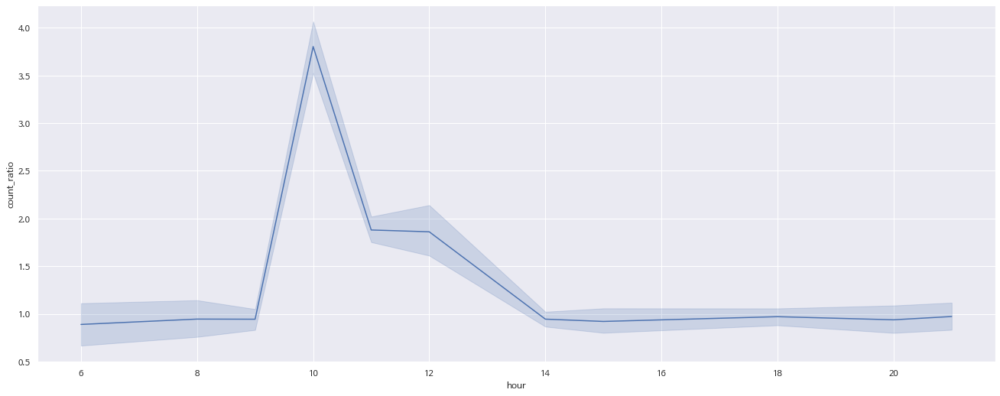

In [ ]:
# 경기도 &  비수기
plt.figure(figsize = (20, 8))
sns.lineplot(data = df_gg_reg2_count[df_gg_reg2_count['seq']== 0], x = 'hour', y ='count_ratio',estimator = 'sum')

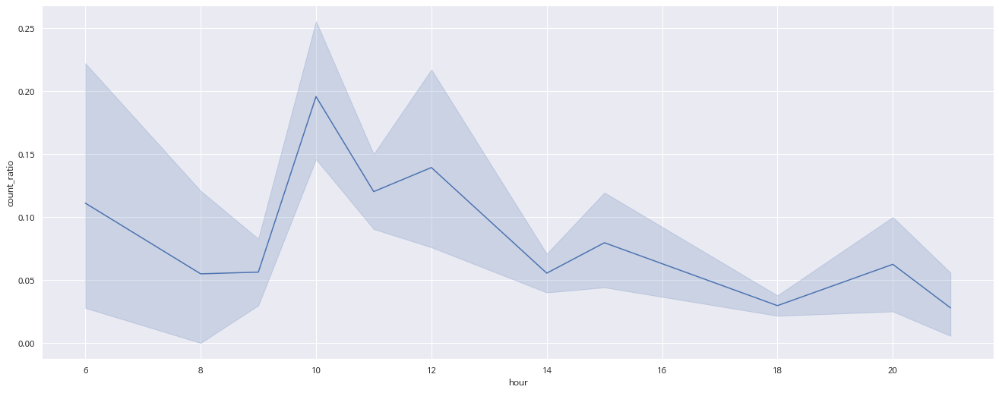

In [ ]:
# 경기도 &  성수기
plt.figure(figsize = (20, 8))
sns.lineplot(data = df_gg_reg2_count[df_gg_reg2_count['seq']== 1], x = 'hour', y ='count_ratio', estimator = 'sum')

In [ ]:
df_gg_f = df_gg[df_gg['gender'] == 'female']
df_gg_reg2_count = df_gg_f.groupby(['region2', 'reservation_start_at'])['count'].sum()
df_gg_reg2_count = df_gg_reg2_count.reset_index().set_index('reservation_start_at')
df_gg_reg2_count = df_gg_reg2_count.groupby('region2')['count'].apply(lambda s : s.asfreq('D').fillna(int(0)))
df_gg_reg2_count = df_gg_reg2_count.reset_index()

def ratio_scaling(x):
    return x / np.sum(x)

df_gg_reg2_count['count_ratio'] = df_gg_reg2_count.groupby('region2')['count'].transform(ratio_scaling)
df_gg_reg2_count['hour'] = df_gg_reg2_count['reservation_start_at'].dt.hour
df_gg_reg2_count['month'] = df_gg_reg2_count['reservation_start_at'].dt.month
df_gg_reg2_count['days'] = df_gg_reg2_count['reservation_start_at'].dt.day
df_gg_reg2_count['weekday'] = df_gg_reg2_count['reservation_start_at'].dt.weekday
df_gg_reg2_count['date'] =df_gg_reg2_count['reservation_start_at'].dt.strftime('%Y-%m-%d')
df_gg_reg2_count = pd.merge(df_gg_reg2_count,test,on= 'date', how= 'left')
df_gg_reg2_count

,region2,reservation_start_at,count,count_ratio,hour,month,days,weekday,date,seq
0,고양시 덕양구,2018-12-30 08:20:00+00:00,1.0,0.043478,8,12,30,6,2018-12-30,0
1,고양시 덕양구,2018-12-31 08:20:00+00:00,0.0,0.000000,8,12,31,0,2018-12-31,0
2,고양시 덕양구,2019-01-01 08:20:00+00:00,0.0,0.000000,8,1,1,1,2019-01-01,0
3,고양시 덕양구,2019-01-02 08:20:00+00:00,0.0,0.000000,8,1,2,2,2019-01-02,0
4,고양시 덕양구,2019-01-03 08:20:00+00:00,1.0,0.043478,8,1,3,3,2019-01-03,0
...,...,...,...,...,...,...,...,...,...,...
5361,화성시,2019-11-26 13:00:00+00:00,0.0,0.000000,13,11,26,1,2019-11-26,0
5362,화성시,2019-11-27 13:00:00+00:00,2.0,0.010526,13,11,27,2,2019-11-27,0
5363,화성시,2019-11-28 13:00:00+00:00,0.0,0.000000,13,11,28,3,2019-11-28,0
5364,화성시,2019-11-29 13:00:00+00:00,0.0,0.000000,13,11,29,4,2019-11-29,0


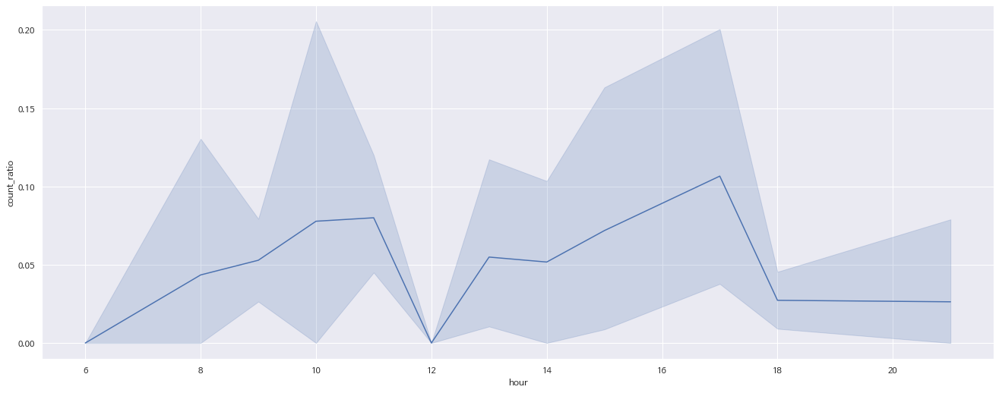

In [ ]:
# 경기도 여자 &  성수기
plt.figure(figsize = (20, 8))
sns.lineplot(data = df_gg_reg2_count[df_gg_reg2_count['seq']==1 ], x = 'hour', y ='count_ratio',estimator = 'sum')

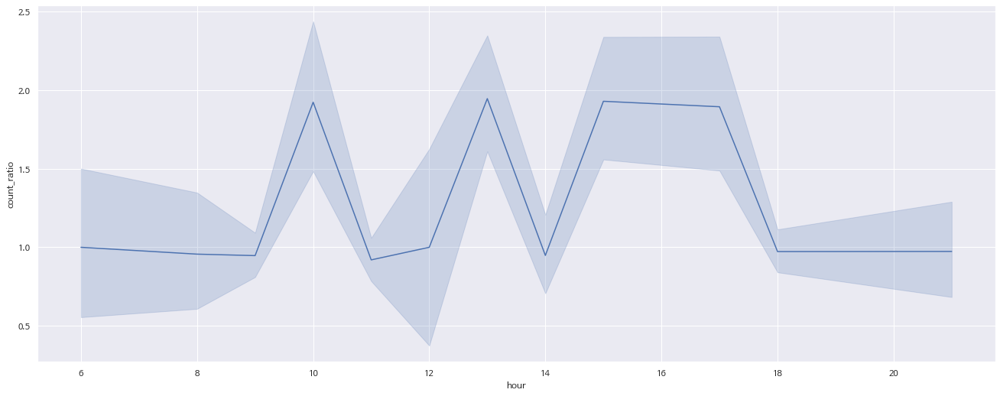

In [ ]:
# 경기도 여자 &  비수기
plt.figure(figsize = (20, 8))
sns.lineplot(data = df_gg_reg2_count[df_gg_reg2_count['seq']==0 ], x = 'hour', y ='count_ratio',estimator = 'sum')

In [ ]:
df_gg_m = df_gg[df_gg['gender'] == 'male']
df_gg_reg2_count = df_gg_m.groupby(['region2', 'reservation_start_at'])['count'].sum()
df_gg_reg2_count = df_gg_reg2_count.reset_index().set_index('reservation_start_at')
df_gg_reg2_count = df_gg_reg2_count.groupby('region2')['count'].apply(lambda s : s.asfreq('D').fillna(int(0)))
df_gg_reg2_count = df_gg_reg2_count.reset_index()

def ratio_scaling(x):
    return x / np.sum(x)

df_gg_reg2_count['count_ratio'] = df_gg_reg2_count.groupby('region2')['count'].transform(ratio_scaling)
df_gg_reg2_count['hour'] = df_gg_reg2_count['reservation_start_at'].dt.hour
df_gg_reg2_count['month'] = df_gg_reg2_count['reservation_start_at'].dt.month
df_gg_reg2_count['days'] = df_gg_reg2_count['reservation_start_at'].dt.day
df_gg_reg2_count['weekday'] = df_gg_reg2_count['reservation_start_at'].dt.weekday
df_gg_reg2_count['date'] =df_gg_reg2_count['reservation_start_at'].dt.strftime('%Y-%m-%d')
df_gg_reg2_count = pd.merge(df_gg_reg2_count,test,on= 'date', how= 'left')
df_gg_reg2_count

,region2,reservation_start_at,count,count_ratio,hour,month,days,weekday,date,seq
0,고양시 덕양구,2018-12-30 08:50:00+00:00,1.0,0.012195,8,12,30,6,2018-12-30,0
1,고양시 덕양구,2018-12-31 08:50:00+00:00,0.0,0.000000,8,12,31,0,2018-12-31,0
2,고양시 덕양구,2019-01-01 08:50:00+00:00,0.0,0.000000,8,1,1,1,2019-01-01,0
3,고양시 덕양구,2019-01-02 08:50:00+00:00,0.0,0.000000,8,1,2,2,2019-01-02,0
4,고양시 덕양구,2019-01-03 08:50:00+00:00,0.0,0.000000,8,1,3,3,2019-01-03,0
...,...,...,...,...,...,...,...,...,...,...
5368,화성시,2019-11-26 14:00:00+00:00,2.0,0.004237,14,11,26,1,2019-11-26,0
5369,화성시,2019-11-27 14:00:00+00:00,1.0,0.002119,14,11,27,2,2019-11-27,0
5370,화성시,2019-11-28 14:00:00+00:00,0.0,0.000000,14,11,28,3,2019-11-28,0
5371,화성시,2019-11-29 14:00:00+00:00,2.0,0.004237,14,11,29,4,2019-11-29,0


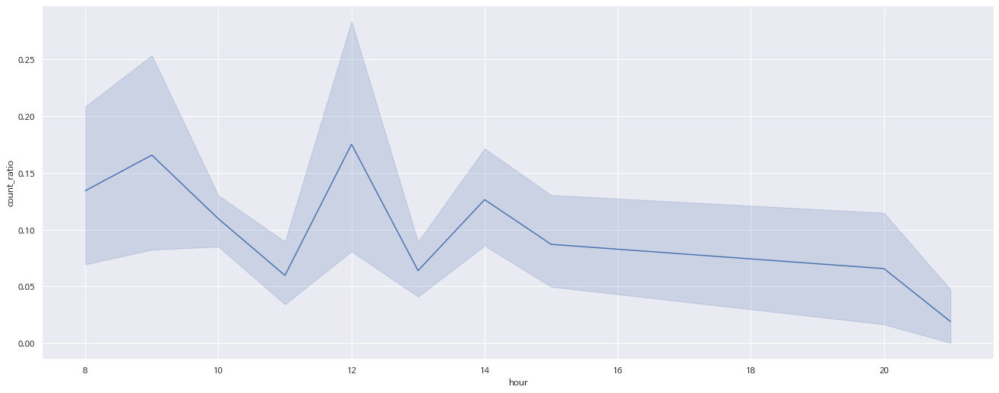

In [ ]:
# 경기도 남자 &  성수기
plt.figure(figsize = (20, 8))
sns.lineplot(data = df_gg_reg2_count[df_gg_reg2_count['seq']==1 ], x = 'hour', y ='count_ratio',estimator = 'sum')

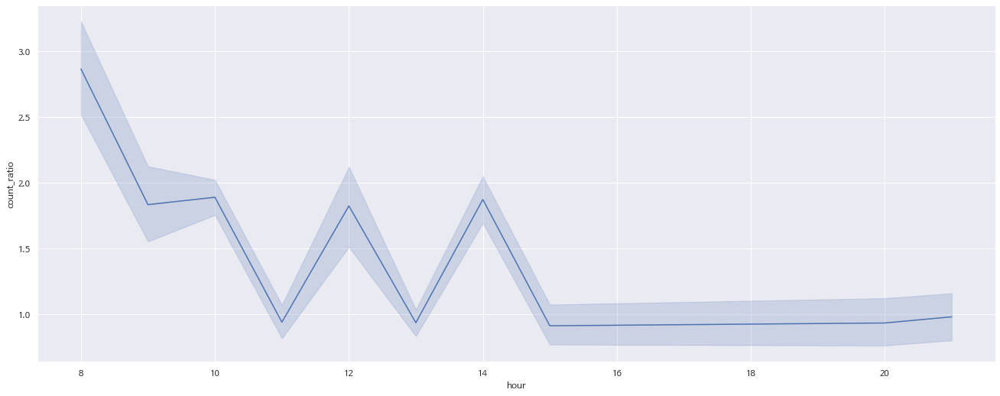

In [ ]:
# 경기도 남자 &  비수기
plt.figure(figsize = (20, 8))
sns.lineplot(data = df_gg_reg2_count[df_gg_reg2_count['seq']==0 ], x = 'hour', y ='count_ratio',estimator = 'sum')

In [ ]:
f, ax = plt.subplots(4, 1, figsize=(40, 20))

sns.lineplot(data = df_gg_reg2_count[df_gg_reg2_count['seq']==1 ], x = 'hour', y ='count_ratio',estimator = 'sum')

In [ ]:
df_gg['region2'].value_counts()

성남시　분당구     46782
화성시         35249
고양시　일산동구    31906
남양주시        26546
고양시　덕양구     26253
의정부시        25225
안양시　동안구     22918
광명시         22645
김포시         21500
성남시　수정구     18773
안양시　만안구     16806
성남시　중원구     16238
고양시　일산서구    16052
하남시         13456
구리시         13011
양평군          2987
Name: region2, dtype: int64

In [ ]:
df[df['region1'] == '울산광역시']['region2'].value_counts()

남구     21836
울주군    13632
동구      4526
북구      3799
중구      3310
Name: region2, dtype: int64

In [ ]:
(휘) - 울산 : 장생포 - 세종 : 세종금남 - 부산 : 사상(부산 강서구가 위아래로 긴 모양) - 전라북도 : 완산(전주시 완산구)